# Introduction to Deep Learning

**Classroom session notebook** — run each cell live and discuss the printed values / plots with students.

## Topics covered
1. Introduction to Deep Learning, scope, and transition from MLP to Deep Neural Networks
2. Backpropagation algorithm
3. Optimization techniques: Gradient Descent (GD)
4. Loss Functions: Cross Entropy, MSE, MAE
5. Regularization Techniques: Dropout, L2

## Hands-on labs
1. Build a Simple MLP: Forward Pass & Loss Calculation
2. Backpropagation Demo (2-2-1 network)
3. Train NN with SGD vs Adam
4. Loss Function Comparison: MSE vs MAE

## 1. Introduction to Deep Learning & Scope

- **Machine Learning vs Deep Learning**: Classical ML relies on hand-crafted features; Deep Learning learns hierarchical features directly from raw data (pixels, text, audio).
- **Scope**: Computer vision, NLP, speech, recommendation systems, generative AI, reinforcement learning.
- **From MLP to Deep Neural Networks**:
  - A **Perceptron** is a single neuron: $z = w \cdot x + b$, $\hat{y} = \phi(z)$.
  - A **Multi-Layer Perceptron (MLP)** stacks perceptrons into layers with non-linear activations, enabling it to learn non-linear decision boundaries (e.g., XOR).
  - A **Deep Neural Network (DNN)** simply has *more hidden layers*, allowing hierarchical feature learning — early layers learn simple patterns, deeper layers combine them into complex/abstract representations.
  - Going deeper increases representational power but also introduces challenges: vanishing/exploding gradients, overfitting, and higher compute cost — motivating techniques like better optimizers, regularization, and normalization covered later in this course.

## 2. The Backpropagation Algorithm

Backpropagation is just the **chain rule** applied layer by layer to compute how the loss changes with respect to every weight in the network.

For a network with forward pass:
$$z^{(1)} = W^{(1)}x + b^{(1)}, \quad a^{(1)} = \phi(z^{(1)})$$
$$z^{(2)} = W^{(2)}a^{(1)} + b^{(2)}, \quad \hat{y} = \phi(z^{(2)})$$

The backward pass computes gradients starting from the output error and propagating backwards:
$$\delta^{(2)} = (\hat{y} - y) \odot \phi'(z^{(2)}) \quad\Rightarrow\quad \frac{\partial L}{\partial W^{(2)}} = \delta^{(2)} (a^{(1)})^T$$
$$\delta^{(1)} = (W^{(2)})^T \delta^{(2)} \odot \phi'(z^{(1)}) \quad\Rightarrow\quad \frac{\partial L}{\partial W^{(1)}} = \delta^{(1)} x^T$$

We will implement this **by hand with NumPy** in Hands-on Lab 2 so students can see every gradient being computed.

## 3. Optimization: Gradient Descent

Gradient Descent updates every parameter in the direction that reduces the loss the fastest:
$$\theta \leftarrow \theta - \eta \, \frac{\partial L}{\partial \theta}$$
where $\eta$ is the learning rate. Variants used later:
- **Batch / Stochastic Gradient Descent (SGD)**: uses one sample (or a mini-batch) per update — noisy but fast per step.
- **Adam**: adapts the learning rate per-parameter using running estimates of the first and second moments of the gradients — usually converges faster and more smoothly than plain SGD.

In [4]:
# Setup: run this first
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(42)
plt.rcParams['figure.figsize'] = (7, 4)
print('Environment ready: numpy', np.__version__)

Environment ready: numpy 2.5.1


### Visualizing Gradient Descent on a simple loss surface

Before touching neural networks, let's *see* gradient descent minimizing a simple 1-D function $f(x) = (x-3)^2 + 2$, so students understand what "following the gradient" means.

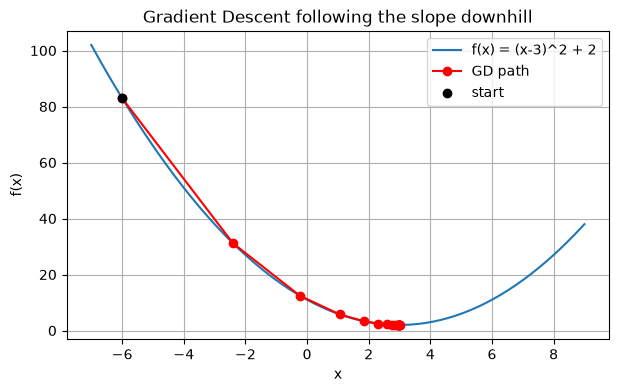

Start x = -6.000 -> after 20 steps x = 3.000 (true minimum x=3)


In [5]:
# Gradient Descent demo on f(x) = (x - 3)^2 + 2
f = lambda x: (x - 3) ** 2 + 2
grad_f = lambda x: 2 * (x - 3)

x = -6.0          # starting point
lr = 0.2          # learning rate
history = [x]

for step in range(20):
    x = x - lr * grad_f(x)
    history.append(x)

xs = np.linspace(-7, 9, 200)
plt.plot(xs, f(xs), label='f(x) = (x-3)^2 + 2')
plt.plot(history, [f(v) for v in history], 'o-', color='red', label='GD path')
plt.scatter([history[0]], [f(history[0])], color='black', zorder=5, label='start')
plt.xlabel('x'); plt.ylabel('f(x)'); plt.title('Gradient Descent following the slope downhill')
plt.legend(); plt.grid(True); plt.show()

print(f'Start x = {history[0]:.3f} -> after 20 steps x = {history[-1]:.3f} (true minimum x=3)')

## 4. Loss Functions: Cross-Entropy, MSE, MAE

- **MSE** (regression): $\frac{1}{n}\sum (y - \hat{y})^2$ — penalizes large errors heavily (sensitive to outliers).
- **MAE** (regression): $\frac{1}{n}\sum |y - \hat{y}|$ — penalizes all errors linearly (robust to outliers).
- **Cross-Entropy** (classification): $-\frac{1}{n}\sum [y\log(\hat{y}) + (1-y)\log(1-\hat{y})]$ — measures divergence between predicted and true probability distributions.

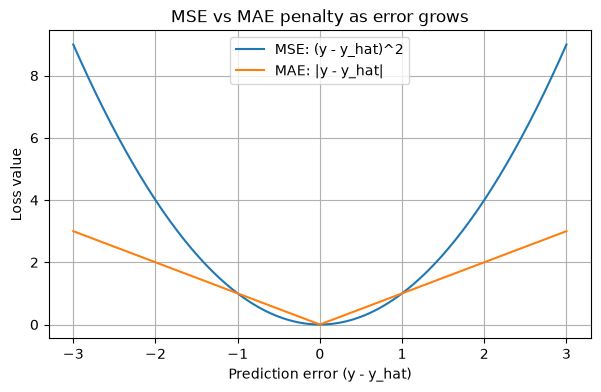

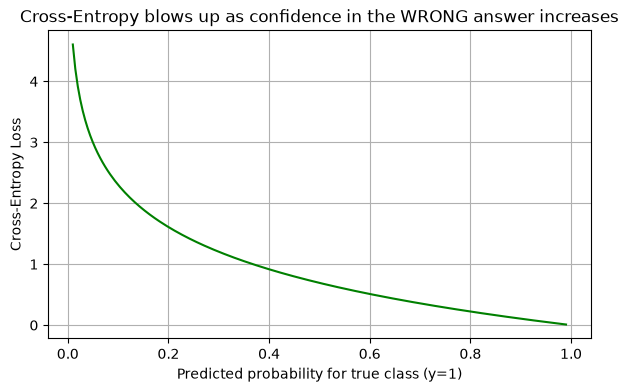

In [6]:
# Visualize how each loss penalizes error differently for a single prediction
error = np.linspace(-3, 3, 200)
mse_loss = error ** 2
mae_loss = np.abs(error)

plt.plot(error, mse_loss, label='MSE: (y - y_hat)^2')
plt.plot(error, mae_loss, label='MAE: |y - y_hat|')
plt.xlabel('Prediction error (y - y_hat)'); plt.ylabel('Loss value')
plt.title('MSE vs MAE penalty as error grows')
plt.legend(); plt.grid(True); plt.show()

# Cross-entropy for a binary classification example (true label y=1)
p_hat = np.linspace(0.01, 0.99, 200)   # predicted probability of class 1
ce_loss = -np.log(p_hat)               # since y = 1

plt.plot(p_hat, ce_loss, color='green')
plt.xlabel('Predicted probability for true class (y=1)'); plt.ylabel('Cross-Entropy Loss')
plt.title('Cross-Entropy blows up as confidence in the WRONG answer increases')
plt.grid(True); plt.show()

## 5. Regularization: Dropout & L2

- **L2 regularization (weight decay)**: adds $\lambda \sum w^2$ to the loss, discouraging large weights and reducing overfitting.
- **Dropout**: randomly zeroes out a fraction $p$ of neuron activations during training, forcing the network to not rely on any single neuron — acts like training an ensemble of sub-networks.

In [7]:
# Tiny demo: what dropout does to an activation vector
activations = np.array([1.2, 0.8, 2.5, 0.3, 1.7, 0.9, 2.1, 1.0])
dropout_rate = 0.4

mask = (np.random.rand(*activations.shape) > dropout_rate).astype(float)
dropped = activations * mask / (1 - dropout_rate)   # inverted dropout scaling

print('Original activations :', activations)
print('Dropout mask (kept=1):', mask)
print('After dropout (scaled):', np.round(dropped, 2))

# L2 penalty demo: larger weights -> larger penalty
weights_small = np.array([0.1, -0.2, 0.15])
weights_large = np.array([2.0, -3.0, 2.5])
lam = 0.01
l2_small = lam * np.sum(weights_small ** 2)
l2_large = lam * np.sum(weights_large ** 2)
print(f'\nL2 penalty (small weights): {l2_small:.5f}')
print(f'L2 penalty (large weights): {l2_large:.5f}  <- pushed down harder by L2')

Original activations : [1.2 0.8 2.5 0.3 1.7 0.9 2.1 1. ]
Dropout mask (kept=1): [0. 1. 1. 1. 0. 0. 0. 1.]
After dropout (scaled): [0.   1.33 4.17 0.5  0.   0.   0.   1.67]

L2 penalty (small weights): 0.00073
L2 penalty (large weights): 0.19250  <- pushed down harder by L2


---
# Hands-on Lab 1: Build a Simple MLP — Forward Pass & Loss Calculation

We manually implement forward propagation on a tiny dataset and compute **both** MSE and Cross-Entropy losses, so students can compare the numbers directly.

Z1 (pre-activation, hidden layer):
 [[ 0.     0.     0.   ]
 [-0.536  0.433 -1.151]
 [ 0.812 -0.306 -0.264]
 [ 0.276  0.127 -1.415]]

A1 (activation, hidden layer):
 [[0.5   0.5   0.5  ]
 [0.369 0.607 0.24 ]
 [0.693 0.424 0.434]
 [0.568 0.532 0.195]]

Z2 (pre-activation, output layer):
 [[0.326]
 [0.129]
 [0.512]
 [0.325]]

Predicted y_hat:
 [[0.581]
 [0.532]
 [0.625]
 [0.58 ]]

True labels y:
 [[0.]
 [1.]
 [1.]
 [0.]]

MSE Loss           : 0.2583
Cross-Entropy Loss : 0.7095


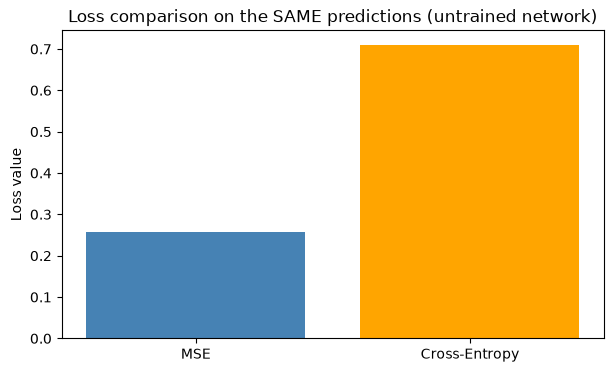

In [8]:
# --- Lab 1: Manual forward pass on a small dataset ---

def sigmoid(z):
    return 1 / (1 + np.exp(-z))

# Small dataset: 4 samples, 2 features each (mimics XOR-style pattern), binary labels
X = np.array([
    [0.0, 0.0],
    [0.0, 1.0],
    [1.0, 0.0],
    [1.0, 1.0],
])
y = np.array([[0.0], [1.0], [1.0], [0.0]])  # XOR labels

# Network architecture: 2 (input) -> 3 (hidden) -> 1 (output)
np.random.seed(1)
W1 = np.random.randn(2, 3) * 0.5
b1 = np.zeros((1, 3))
W2 = np.random.randn(3, 1) * 0.5
b2 = np.zeros((1, 1))

# ---- Forward pass (manual, step by step) ----
Z1 = X @ W1 + b1        # linear step 1
A1 = sigmoid(Z1)        # activation 1
Z2 = A1 @ W2 + b2       # linear step 2
y_hat = sigmoid(Z2)     # final prediction (output activation)

print('Z1 (pre-activation, hidden layer):\n', np.round(Z1, 3))
print('\nA1 (activation, hidden layer):\n', np.round(A1, 3))
print('\nZ2 (pre-activation, output layer):\n', np.round(Z2, 3))
print('\nPredicted y_hat:\n', np.round(y_hat, 3))
print('\nTrue labels y:\n', y)

# ---- Loss calculation ----
mse = np.mean((y - y_hat) ** 2)
eps = 1e-9  # avoid log(0)
cross_entropy = -np.mean(y * np.log(y_hat + eps) + (1 - y) * np.log(1 - y_hat + eps))

print(f'\nMSE Loss           : {mse:.4f}')
print(f'Cross-Entropy Loss : {cross_entropy:.4f}')

plt.bar(['MSE', 'Cross-Entropy'], [mse, cross_entropy], color=['steelblue', 'orange'])
plt.title('Loss comparison on the SAME predictions (untrained network)')
plt.ylabel('Loss value'); plt.show()

---
# Hands-on Lab 2: Backpropagation Demo (2-2-1 network)

A tiny 2 input -> 2 hidden -> 1 output network. We compute the forward pass, then **manually** derive and print every gradient in the backward pass, and finally run several gradient-descent updates to observe how the gradients shrink as the network learns.

Initial W1:
 [[ 0.845 -0.233]
 [ 0.016  0.204]] 
Initial W2:
 [[-0.394]
 [ 0.001]] 

Epoch  1 | loss=0.31301 | dW2=[-0.0837 -0.0705] | dW1_norm=0.0122
Epoch  2 | loss=0.28233 | dW2=[-0.08   -0.0677] | dW1_norm=0.0106
Epoch  3 | loss=0.25430 | dW2=[-0.0759 -0.0645] | dW1_norm=0.0091
Epoch  4 | loss=0.22900 | dW2=[-0.0716 -0.0612] | dW1_norm=0.0080
Epoch  5 | loss=0.20640 | dW2=[-0.0673 -0.0578] | dW1_norm=0.0071
Epoch  6 | loss=0.18635 | dW2=[-0.0632 -0.0544] | dW1_norm=0.0064
Epoch  7 | loss=0.16865 | dW2=[-0.0592 -0.0512] | dW1_norm=0.0059
Epoch  8 | loss=0.15308 | dW2=[-0.0554 -0.0481] | dW1_norm=0.0056
Epoch  9 | loss=0.13939 | dW2=[-0.0518 -0.0452] | dW1_norm=0.0054
Epoch 10 | loss=0.12735 | dW2=[-0.0486 -0.0425] | dW1_norm=0.0053


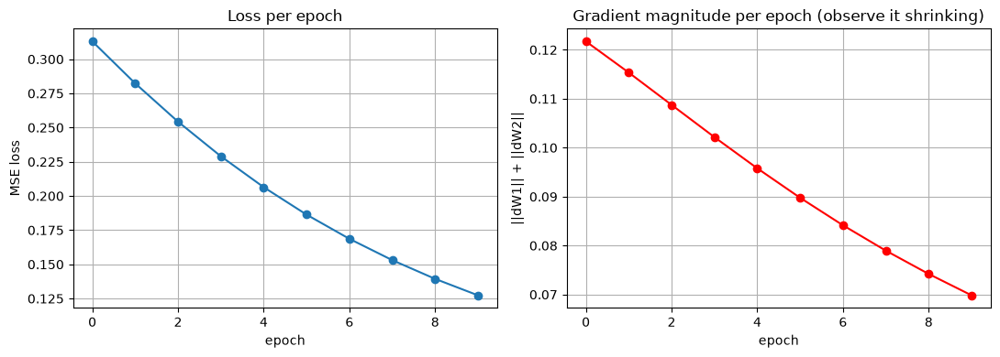

In [9]:
# --- Lab 2: Manual backpropagation for a 2-2-1 network ---

def sigmoid(z):
    return 1 / (1 + np.exp(-z))

def sigmoid_deriv(a):
    # derivative w.r.t. z, expressed using the activation a = sigmoid(z)
    return a * (1 - a)

# Single training example for clarity
x = np.array([[0.5, 0.8]])   # shape (1, 2)
y_true = np.array([[1.0]])   # target

np.random.seed(7)
W1 = np.random.randn(2, 2) * 0.5   # input -> hidden (2-2)
b1 = np.zeros((1, 2))
W2 = np.random.randn(2, 1) * 0.5   # hidden -> output (2-1)
b2 = np.zeros((1, 1))

lr = 0.5
loss_history = []
grad_norm_history = []

print('Initial W1:\n', np.round(W1, 3), '\nInitial W2:\n', np.round(W2, 3), '\n')

for epoch in range(10):
    # ---- Forward pass ----
    z1 = x @ W1 + b1
    a1 = sigmoid(z1)
    z2 = a1 @ W2 + b2
    a2 = sigmoid(z2)          # prediction

    loss = np.mean((y_true - a2) ** 2)

    # ---- Backward pass (manual chain rule) ----
    dLoss_da2 = -(y_true - a2)                 # dL/da2  (MSE derivative)
    delta2 = dLoss_da2 * sigmoid_deriv(a2)      # delta at output layer
    dW2 = a1.T @ delta2
    db2 = delta2

    delta1 = (delta2 @ W2.T) * sigmoid_deriv(a1)  # delta at hidden layer
    dW1 = x.T @ delta1
    db1 = delta1

    grad_norm = np.linalg.norm(dW1) + np.linalg.norm(dW2)
    loss_history.append(loss)
    grad_norm_history.append(grad_norm)

    print(f'Epoch {epoch+1:2d} | loss={loss:.5f} | dW2={np.round(dW2.ravel(),4)} | dW1_norm={np.linalg.norm(dW1):.4f}')

    # ---- Gradient descent update ----
    W2 -= lr * dW2
    b2 -= lr * db2
    W1 -= lr * dW1
    b1 -= lr * db1

fig, axes = plt.subplots(1, 2, figsize=(11, 4))
axes[0].plot(loss_history, 'o-')
axes[0].set_title('Loss per epoch'); axes[0].set_xlabel('epoch'); axes[0].set_ylabel('MSE loss'); axes[0].grid(True)
axes[1].plot(grad_norm_history, 'o-', color='red')
axes[1].set_title('Gradient magnitude per epoch (observe it shrinking)')
axes[1].set_xlabel('epoch'); axes[1].set_ylabel('||dW1|| + ||dW2||'); axes[1].grid(True)
plt.tight_layout(); plt.show()

---
# Hands-on Lab 3: Train a Neural Network with SGD vs Adam

We train the **same** small network (2-4-1) on a XOR-style dataset twice — once with plain SGD, once with Adam — and plot the loss/accuracy convergence curves side by side.

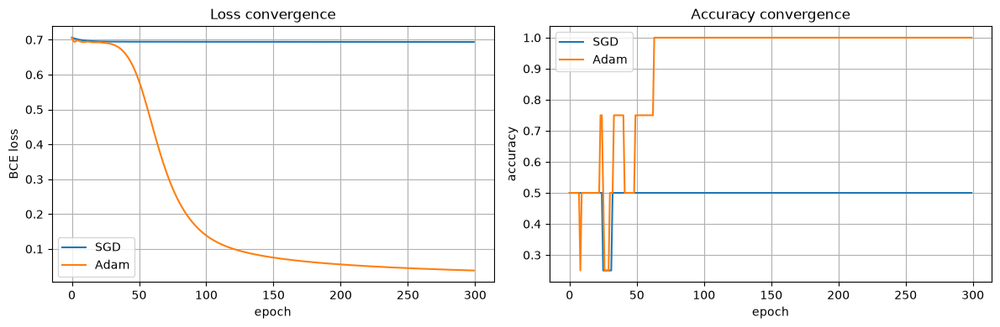

Final SGD  -> loss: 0.6938, accuracy: 0.50
Final Adam -> loss: 0.0381, accuracy: 1.00


In [10]:
# --- Lab 3: SGD vs Adam on a small classification task ---

def sigmoid(z):
    return 1 / (1 + np.exp(-z))

# XOR dataset (a few repeats so it behaves like a mini training set)
X = np.tile(np.array([[0, 0], [0, 1], [1, 0], [1, 1]], dtype=float), (25, 1))
y = np.tile(np.array([[0], [1], [1], [0]], dtype=float), (25, 1))

def init_params(seed):
    rng = np.random.RandomState(seed)
    return {
        'W1': rng.randn(2, 4) * 0.5, 'b1': np.zeros((1, 4)),
        'W2': rng.randn(4, 1) * 0.5, 'b2': np.zeros((1, 1)),
    }

def forward(params, X):
    z1 = X @ params['W1'] + params['b1']
    a1 = sigmoid(z1)
    z2 = a1 @ params['W2'] + params['b2']
    a2 = sigmoid(z2)
    return a1, a2

def backward(params, X, y, a1, a2):
    delta2 = (a2 - y) * a2 * (1 - a2)
    dW2 = a1.T @ delta2 / len(X)
    db2 = np.mean(delta2, axis=0, keepdims=True)
    delta1 = (delta2 @ params['W2'].T) * a1 * (1 - a1)
    dW1 = X.T @ delta1 / len(X)
    db1 = np.mean(delta1, axis=0, keepdims=True)
    return {'W1': dW1, 'b1': db1, 'W2': dW2, 'b2': db2}

def bce_loss(y, a2):
    eps = 1e-9
    return -np.mean(y * np.log(a2 + eps) + (1 - y) * np.log(1 - a2 + eps))

def accuracy(y, a2):
    return np.mean((a2 > 0.5).astype(float) == y)

def train(optimizer, epochs=300, lr=0.5):
    params = init_params(seed=3)
    # Adam state
    m = {k: np.zeros_like(v) for k, v in params.items()}
    v = {k: np.zeros_like(v) for k, v in params.items()}
    beta1, beta2, eps = 0.9, 0.999, 1e-8
    losses, accs = [], []

    for t in range(1, epochs + 1):
        a1, a2 = forward(params, X)
        grads = backward(params, X, y, a1, a2)
        losses.append(bce_loss(y, a2))
        accs.append(accuracy(y, a2))

        for k in params:
            if optimizer == 'sgd':
                params[k] -= lr * grads[k]
            elif optimizer == 'adam':
                m[k] = beta1 * m[k] + (1 - beta1) * grads[k]
                v[k] = beta2 * v[k] + (1 - beta2) * (grads[k] ** 2)
                m_hat = m[k] / (1 - beta1 ** t)
                v_hat = v[k] / (1 - beta2 ** t)
                params[k] -= lr * 0.1 * m_hat / (np.sqrt(v_hat) + eps)  # smaller lr scale for Adam
    return losses, accs

sgd_losses, sgd_accs = train('sgd')
adam_losses, adam_accs = train('adam')

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].plot(sgd_losses, label='SGD')
axes[0].plot(adam_losses, label='Adam')
axes[0].set_title('Loss convergence'); axes[0].set_xlabel('epoch'); axes[0].set_ylabel('BCE loss')
axes[0].legend(); axes[0].grid(True)

axes[1].plot(sgd_accs, label='SGD')
axes[1].plot(adam_accs, label='Adam')
axes[1].set_title('Accuracy convergence'); axes[1].set_xlabel('epoch'); axes[1].set_ylabel('accuracy')
axes[1].legend(); axes[1].grid(True)
plt.tight_layout(); plt.show()

print(f'Final SGD  -> loss: {sgd_losses[-1]:.4f}, accuracy: {sgd_accs[-1]:.2f}')
print(f'Final Adam -> loss: {adam_losses[-1]:.4f}, accuracy: {adam_accs[-1]:.2f}')

---
# Hands-on Lab 4: Loss Function Comparison — MSE vs MAE

We fit a simple **linear regression model** ($\hat{y} = wx + b$) with gradient descent on noisy data that contains a couple of **outliers**, once using MSE and once using MAE, and compare the resulting fit lines and error curves.

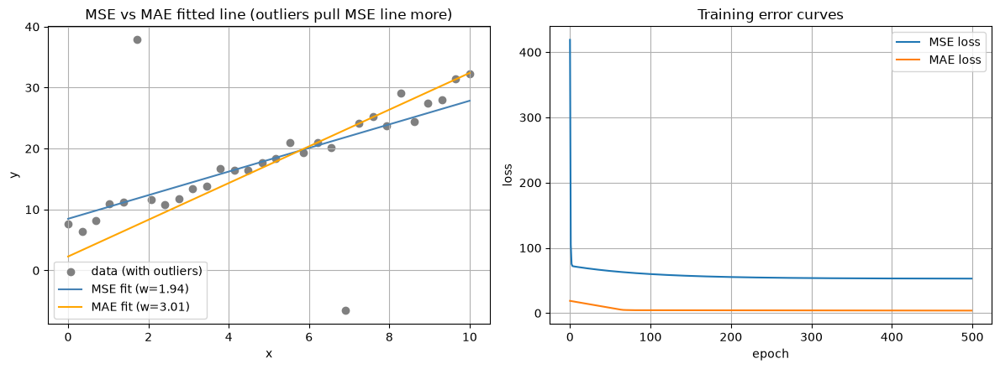

MSE fit -> slope: 1.937, intercept: 8.477
MAE fit -> slope: 3.012, intercept: 2.289
True underlying slope/intercept: 2.5 / 5 (MAE should stay closer to this despite outliers)


In [11]:
# --- Lab 4: MSE vs MAE regression with outliers ---

rng = np.random.RandomState(0)
x_data = np.linspace(0, 10, 30)
y_data = 2.5 * x_data + 5 + rng.normal(0, 1.5, size=x_data.shape)

# Inject a couple of strong outliers
y_data[5] += 30
y_data[20] -= 25

def train_regression(loss_type, epochs=500, lr=0.01):
    w, b = 0.0, 0.0
    history = []
    n = len(x_data)
    for _ in range(epochs):
        y_pred = w * x_data + b
        error = y_pred - y_data
        if loss_type == 'mse':
            loss = np.mean(error ** 2)
            dw = np.mean(2 * error * x_data)
            db = np.mean(2 * error)
        else:  # mae
            loss = np.mean(np.abs(error))
            dw = np.mean(np.sign(error) * x_data)
            db = np.mean(np.sign(error))
        w -= lr * dw
        b -= lr * db
        history.append(loss)
    return w, b, history

w_mse, b_mse, mse_history = train_regression('mse')
w_mae, b_mae, mae_history = train_regression('mae')

fig, axes = plt.subplots(1, 2, figsize=(12, 4.5))

axes[0].scatter(x_data, y_data, label='data (with outliers)', color='gray')
axes[0].plot(x_data, w_mse * x_data + b_mse, color='steelblue', label=f'MSE fit (w={w_mse:.2f})')
axes[0].plot(x_data, w_mae * x_data + b_mae, color='orange', label=f'MAE fit (w={w_mae:.2f})')
axes[0].set_title('MSE vs MAE fitted line (outliers pull MSE line more)')
axes[0].set_xlabel('x'); axes[0].set_ylabel('y'); axes[0].legend(); axes[0].grid(True)

axes[1].plot(mse_history, label='MSE loss')
axes[1].plot(mae_history, label='MAE loss')
axes[1].set_title('Training error curves'); axes[1].set_xlabel('epoch'); axes[1].set_ylabel('loss')
axes[1].legend(); axes[1].grid(True)

plt.tight_layout(); plt.show()

print(f'MSE fit -> slope: {w_mse:.3f}, intercept: {b_mse:.3f}')
print(f'MAE fit -> slope: {w_mae:.3f}, intercept: {b_mae:.3f}')
print('True underlying slope/intercept: 2.5 / 5 (MAE should stay closer to this despite outliers)')

---
# Animated Visualizations (live classroom demos)

Static plots show the *final* result — animations let students watch the **process** happen frame by frame. Each cell below builds a `matplotlib.animation.FuncAnimation` and renders it inline as an interactive HTML5/JS player (with play, pause, and a frame scrubber) using `IPython.display.HTML`.

Run each cell and use the player controls under the plot to step through the animation with the class:
1. Gradient Descent sliding down the loss curve
2. Backpropagation: loss shrinking & output-layer weights updating (2-2-1 network)
3. SGD vs Adam: loss curves racing to convergence
4. MSE vs MAE: watching the regression line settle into place

In [15]:
# Animation setup: run once before the animation cells below
from matplotlib import animation
from IPython.display import HTML

plt.rcParams['animation.embed_limit'] = 50  # MB, room for embedding larger animations
print('Animation tools ready.')

Animation tools ready.


## Animation 1 — Gradient Descent sliding down the loss curve

Watch the red dot roll downhill towards the minimum, one gradient step per frame.

In [16]:
# --- Animation 1: Gradient Descent path animation ---

x0 = -6.0
lr_anim = 0.2
gd_path = [x0]
for _ in range(25):
    x0 = x0 - lr_anim * grad_f(x0)
    gd_path.append(x0)

xs_anim = np.linspace(-7, 9, 200)
fig_a, ax_a = plt.subplots(figsize=(7, 4))
ax_a.plot(xs_anim, f(xs_anim), label='f(x) = (x-3)^2 + 2')
point_a, = ax_a.plot([], [], 'ro', markersize=10, label='current position')
trail_a, = ax_a.plot([], [], 'r--', alpha=0.6)
ax_a.set_xlabel('x'); ax_a.set_ylabel('f(x)')
ax_a.legend(); ax_a.grid(True)

def update_a(frame):
    point_a.set_data([gd_path[frame]], [f(gd_path[frame])])
    trail_a.set_data(gd_path[:frame + 1], [f(v) for v in gd_path[:frame + 1]])
    ax_a.set_title(f'Gradient Descent — step {frame}/{len(gd_path) - 1}, x = {gd_path[frame]:.3f}')
    return point_a, trail_a

anim_a = animation.FuncAnimation(fig_a, update_a, frames=len(gd_path), interval=300, blit=False)
plt.close(fig_a)
HTML(anim_a.to_jshtml())

## Animation 2 — Backpropagation: loss shrinking & weights updating

Same 2-2-1 network as Lab 2, trained for more epochs. Left panel: loss curve being drawn live. Right panel: the output-layer weights `W2` visibly moving as gradient descent updates them.

In [18]:
# --- Animation 2: Backpropagation - loss & weight evolution ---

x_b = np.array([[0.5, 0.8]])
y_b = np.array([[1.0]])
rng_b = np.random.RandomState(7)
W1_b = rng_b.randn(2, 2) * 0.5
b1_b = np.zeros((1, 2))
W2_b = rng_b.randn(2, 1) * 0.5
b2_b = np.zeros((1, 1))
lr_b = 0.5

anim_loss_hist = []
anim_w2_hist = []

for epoch in range(60):
    z1 = x_b @ W1_b + b1_b
    a1 = sigmoid(z1)
    z2 = a1 @ W2_b + b2_b
    a2 = sigmoid(z2)
    loss = np.mean((y_b - a2) ** 2)

    delta2 = -(y_b - a2) * sigmoid_deriv(a2)
    dW2 = a1.T @ delta2
    db2 = delta2
    delta1 = (delta2 @ W2_b.T) * sigmoid_deriv(a1)
    dW1 = x_b.T @ delta1
    db1 = delta1

    anim_loss_hist.append(loss)
    anim_w2_hist.append(W2_b.ravel().copy())

    W2_b -= lr_b * dW2
    b2_b -= lr_b * db2
    W1_b -= lr_b * dW1
    b1_b -= lr_b * db1

anim_w2_hist = np.array(anim_w2_hist)

fig_b, (ax_b1, ax_b2) = plt.subplots(1, 2, figsize=(11, 4))
line_b, = ax_b1.plot([], [], 'o-')
ax_b1.set_xlim(0, len(anim_loss_hist))
ax_b1.set_ylim(0, max(anim_loss_hist) * 1.1)
ax_b1.set_xlabel('epoch'); ax_b1.set_ylabel('MSE loss'); ax_b1.set_title('Loss decreasing')
ax_b1.grid(True)

bars_b = ax_b2.bar(['W2[0]', 'W2[1]'], anim_w2_hist[0])
ax_b2.set_ylim(anim_w2_hist.min() - 0.5, anim_w2_hist.max() + 0.5)
ax_b2.set_title('Output-layer weights changing')

def update_b(frame):
    line_b.set_data(range(frame + 1), anim_loss_hist[:frame + 1])
    for bar, h in zip(bars_b, anim_w2_hist[frame]):
        bar.set_height(h)
    fig_b.suptitle(f'Backpropagation — epoch {frame}')
    return (line_b, *bars_b)

anim_b = animation.FuncAnimation(fig_b, update_b, frames=len(anim_loss_hist), interval=150, blit=False)
plt.close(fig_b)
HTML(anim_b.to_jshtml())

## Animation 3 — SGD vs Adam: convergence race

Reuses the `sgd_losses` / `adam_losses` curves from Lab 3 and draws them frame by frame so students can literally see which optimizer converges faster.

In [20]:
# --- Animation 3: SGD vs Adam convergence race ---

fig_c, ax_c = plt.subplots(figsize=(7, 4))
line_sgd, = ax_c.plot([], [], label='SGD', color='tab:blue')
line_adam, = ax_c.plot([], [], label='Adam', color='tab:orange')
ax_c.set_xlim(0, len(sgd_losses))
ax_c.set_ylim(0, max(max(sgd_losses), max(adam_losses)) * 1.05)
ax_c.set_xlabel('epoch'); ax_c.set_ylabel('BCE loss')
ax_c.legend(); ax_c.grid(True)

step_c = 4  # skip frames so the animation stays short and smooth
frame_indices_c = list(range(0, len(sgd_losses), step_c))

def update_c(i):
    frame = frame_indices_c[i]
    line_sgd.set_data(range(frame + 1), sgd_losses[:frame + 1])
    line_adam.set_data(range(frame + 1), adam_losses[:frame + 1])
    ax_c.set_title(f'SGD vs Adam — epoch {frame}')
    return line_sgd, line_adam

anim_c = animation.FuncAnimation(fig_c, update_c, frames=len(frame_indices_c), interval=60, blit=False)
plt.close(fig_c)
HTML(anim_c.to_jshtml())

## Animation 4 — MSE vs MAE: watching the fitted line settle

Both lines start flat at the origin and adjust every frame. Watch how the MSE line gets pulled towards the outliers while the MAE line stays closer to the true trend.

In [21]:
# --- Animation 4: MSE vs MAE — watching the fitted line adjust ---

def train_regression_track(loss_type, epochs=150, lr=0.01):
    w, b = 0.0, 0.0
    params_hist = []
    for _ in range(epochs):
        y_pred = w * x_data + b
        error = y_pred - y_data
        if loss_type == 'mse':
            dw = np.mean(2 * error * x_data)
            db = np.mean(2 * error)
        else:  # mae
            dw = np.mean(np.sign(error) * x_data)
            db = np.mean(np.sign(error))
        w -= lr * dw
        b -= lr * db
        params_hist.append((w, b))
    return params_hist

mse_params_hist = train_regression_track('mse')
mae_params_hist = train_regression_track('mae')

fig_d, ax_d = plt.subplots(figsize=(7, 5))
ax_d.scatter(x_data, y_data, color='gray', label='data (with outliers)')
line_mse_d, = ax_d.plot([], [], color='steelblue', label='MSE fit')
line_mae_d, = ax_d.plot([], [], color='orange', label='MAE fit')
ax_d.set_xlabel('x'); ax_d.set_ylabel('y')
ax_d.legend(); ax_d.grid(True)

def update_d(frame):
    w_m, b_m = mse_params_hist[frame]
    w_a, b_a = mae_params_hist[frame]
    line_mse_d.set_data(x_data, w_m * x_data + b_m)
    line_mae_d.set_data(x_data, w_a * x_data + b_a)
    ax_d.set_title(f'MSE vs MAE fit — epoch {frame}')
    return line_mse_d, line_mae_d

anim_d = animation.FuncAnimation(fig_d, update_d, frames=len(mse_params_hist), interval=80, blit=False)
plt.close(fig_d)
HTML(anim_d.to_jshtml())